In [58]:
from PIL import Image, ImageDraw, ImageFont
import json
from IPython.display import display

# Specify directory where the images are located
#image_directory = "/Users/caraappel/Documents/CV4E"
image_directory = '/Volumes/Cara_cam_traps/CV4E/data_cleaned/demo2'

# Load COCO JSON file
#coco_json_path = '/Users/caraappel/Documents/CV4E/oregon_critters/coco_json/both.json'
coco_json_path = '/Volumes/Cara_cam_traps/CV4E/data_cleaned/demo2/predictions_coco.json'
with open(coco_json_path, 'r') as json_file:
    coco_data = json.load(json_file)


In [51]:
print(json.dumps(coco_data['ground_truth'], indent=4)[:300])

[
    {
        "id": 1,
        "image_id": 2,
        "name": "TownsendsChipmunk",
        "category_id": 29,
        "bbox": [
            709.86624924905,
            1236.77310101091,
            699.452111957026,
            342.906906166591
        ]
    },
    {
        "id": 2,
        "ima


In [80]:
# Define function to visualize annotations for a specific image
def visualize_annotations_for_image(image_info, annotations, categories):
    image_path = image_directory + "/" + image_info['file_name']
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    print(image_path)
 
    # Customize font and fill color for the label text
    #label_font = ImageFont.load_default()  
    label_font = ImageFont.truetype('/Users/caraappel/Documents/Inclusive_Sans/InclusiveSans-Regular.ttf', 72)
    label_fill = 'white'  
    
    for ann in annotations:
        
        if ann['score'] > 0.1:
            # Draw the bounding box
            bbox = ann['bbox']
            x1, y1, width, height = bbox
            x2, y2 = x1 + width, y1 + height
            draw.rectangle([x1, y1, x2, y2], outline='red', width=8)
            
            category_id = ann['category_id']
            category_name = next((cat['name'] for cat in categories if cat['id'] == category_id), "Unknown")
            score = round(ann['score'], 2)
            label_text = f"{category_name} {score}"
            
            # Draw the textbox
            label_bbox = draw.textbbox((x1, y1), label_text, font=label_font)
            draw.rectangle(label_bbox, fill='red')
        
            # Add label text
            draw.text((label_bbox[0], label_bbox[1]), label_text, fill=label_fill, font=label_font)

    display(image)  #to display the image directly in the notebook
    #image.show()     #to open a new window with the image

# Define function to visualize ground truth box for a specific image:
def visualize_ground_truth_for_image(image_info, ground_truth):
    image_path = image_directory + "/" + image_info['file_name']
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    # Customize font and fill color for the label text
    label_font = ImageFont.truetype('/Users/caraappel/Documents/Inclusive_Sans/InclusiveSans-Regular.ttf', 72)
    label_fill = 'white'  

    for gt in ground_truth:

        bbox = gt['bbox']
        x1, y1, width, height = bbox
        x2, y2 = x1 + width, y1 + height
        draw.rectangle([x1, y1, x2, y2], outline='blue', width=8)

        name = gt['name']
        label_text = f"{name}"

        label_bbox = draw.textbbox((x1,y1), label_text, font=label_font)
        draw.rectangle(label_bbox, fill='blue')

        draw.text((x1,y1), label_text, fill=label_fill, font=label_font)

    display(image)


/Volumes/Cara_cam_traps/CV4E/data_cleaned/demo2//data/COA_2020/hailey.hester-COA_2020_BlackTailedDeer_HH/images/Drive_04_04020071_jn.JPG


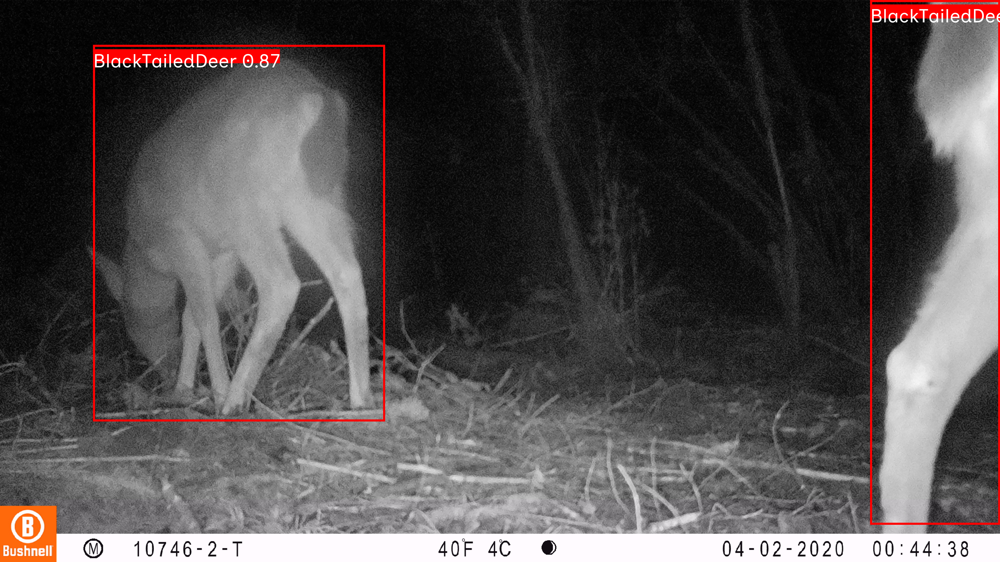

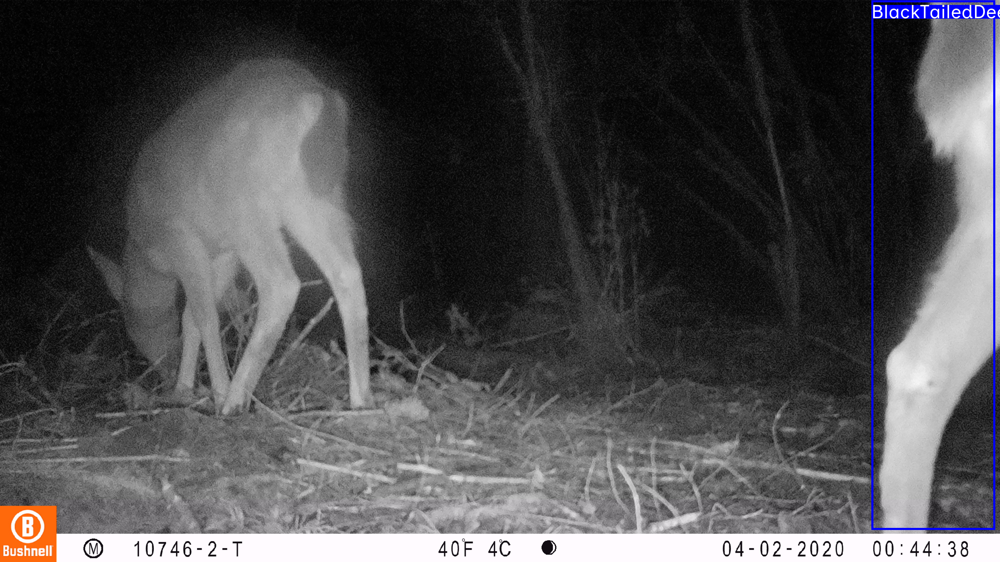

In [86]:
# Choose an image ID to visualize
image_id_to_visualize = 54

# Find the image information, annotations, and categories for the specified image ID
image_info = next((img for img in coco_data['images'] if img['id'] == image_id_to_visualize), None)
annotations = [ann for ann in coco_data['annotations'] if ann['image_id'] == image_id_to_visualize]
categories = coco_data['categories']
ground_truth = [gt for gt in coco_data['ground_truth'] if gt['image_id'] == image_id_to_visualize]

# Visualize the bounding boxes and labels for the specified image
if image_info and annotations:
    visualize_annotations_for_image(image_info, annotations, categories)
    visualize_ground_truth_for_image(image_info, ground_truth)
else:
    print("Image information or annotations not found.")